In [7]:
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import yaml
import hickle as hkl
from numpy.random import rand
from matplotlib.pyplot import imshow
from PIL import Image
from IPython.display import display
import numpy as np
import copy
import boto3

with open('../../config.yaml', 'r') as stream:
    key = (yaml.safe_load(stream))
    API_KEY = key['key']
    SHUB_SECRET = key['shub_secret']
    SHUB_KEY = key['shub_id']
    AWSKEY = key['awskey']
    AWSSECRET = key['awssecret']

def download_single_file(s3_file, local_file, apikey, apisecret, bucket):
    conn = boto3.client('s3', aws_access_key_id=apikey,
                        aws_secret_access_key=apisecret) 
    print(f"Starting download of {s3_file} to {local_file} from {bucket}")
    key = "/".join(s3_file.split("/")[3:])
    conn.download_file(bucket, key, local_file)
    
def arr_to_rgb(arr, i, start):
    l = np.copy(arr[0, ..., :3])
    l_red = np.copy(arr[i, ..., start + 2])
    l_blue = np.copy(arr[i, ..., start])
    l[..., 0] = np.copy(arr[i, ..., start + 2])
    l[..., 1] = np.copy(arr[i, ..., start + 1])
    l[..., 2] = np.copy(arr[i, ..., start])
    l = np.clip(l, 0, np.percentile(l, 99.9, axis = (0, 1)))
    maxes = np.array(np.max(l, axis = (0, 1)))
    l = l / maxes
    l = Image.fromarray((l * 255).astype(np.uint8), 'RGB')
    return l

Starting download of s3://tof-output/2020/raw/1660/1073/raw/s2_10/1660X1073Y.hkl to tmp.hkl from tof-output


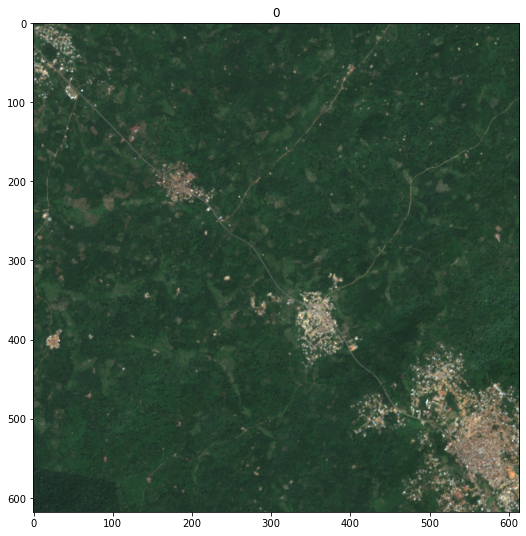

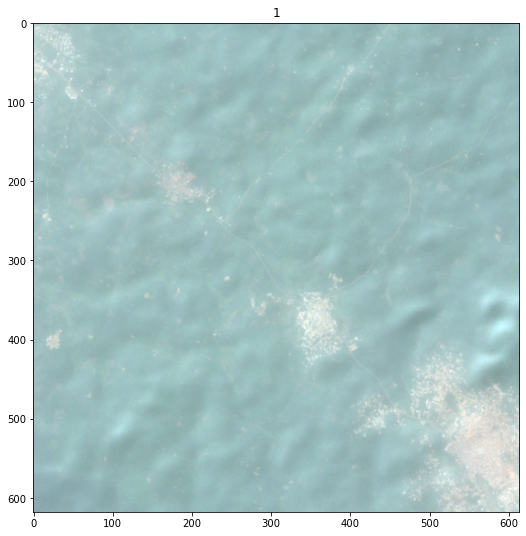

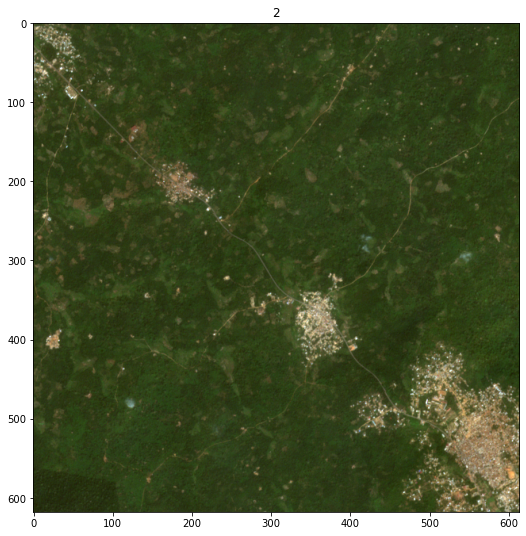

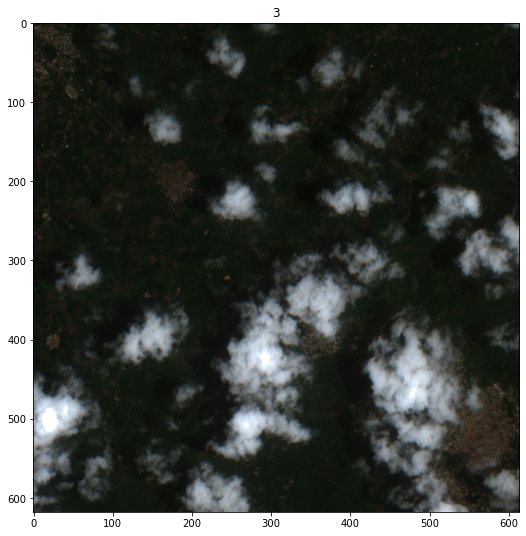

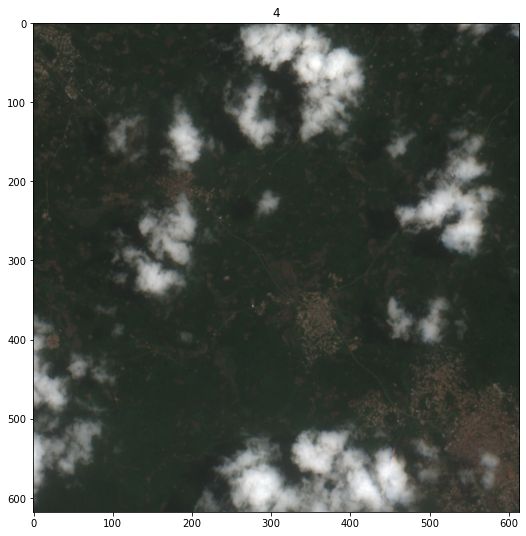

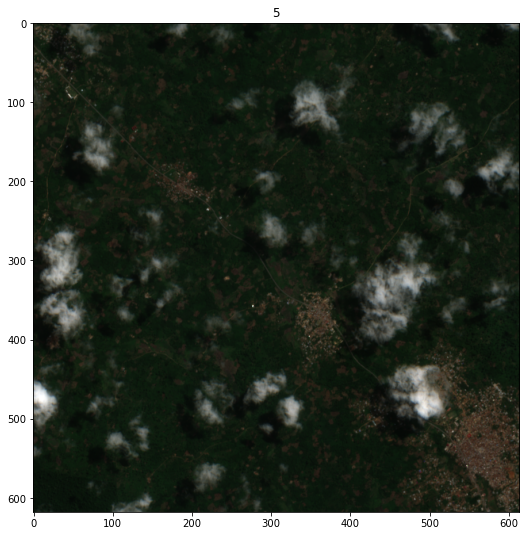

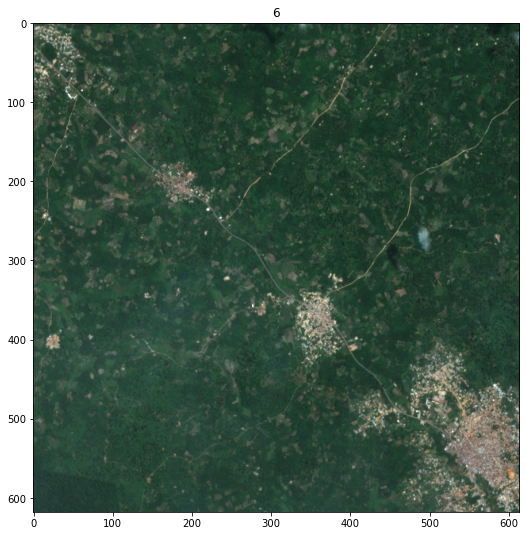

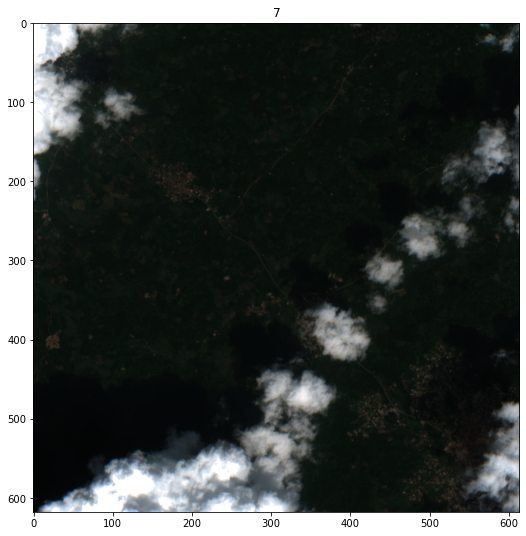

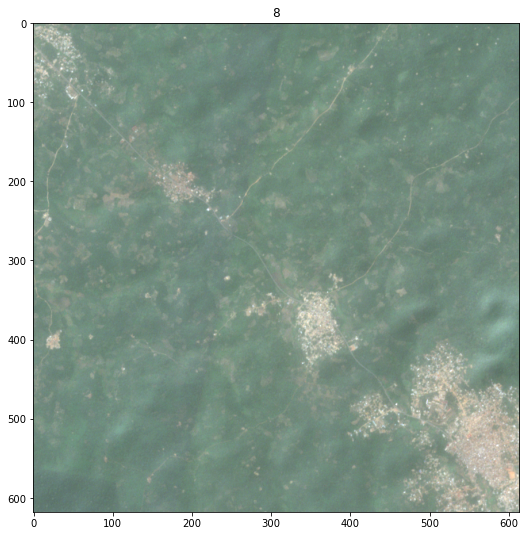

In [14]:
x = 1660
y = 1073
year = 2020

x, y = str(x), str(y)
s3_path = f's3://tof-output/{year}/raw/{x}/{y}/raw/s2_10/{x}X{y}Y.hkl'
download_single_file(s3_path, 'tmp.hkl', AWSKEY, AWSSECRET, 'tof-output')
data = hkl.load("tmp.hkl")

for i in range(0, data.shape[0]):
    im = arr_to_rgb(data, i, 0)
    plt.figure(figsize=(10,9))
    plt.imshow(im)
    plt.title(i)

Starting download of s3://tof-output/2020/ard/1660/1073/1660X1073Y_ard.hkl to tmp.hkl from tof-output


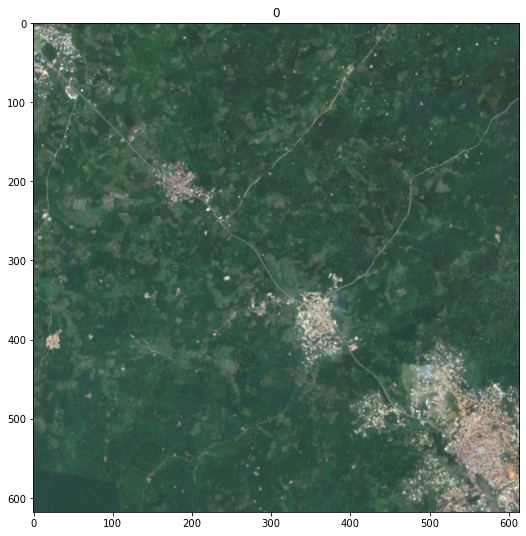

In [17]:
x = 1660
y = 1073
year = 2020

x, y = str(x), str(y)
s3_path = f's3://tof-output/{year}/ard/{x}/{y}/{x}X{y}Y_ard.hkl'
download_single_file(s3_path, 'tmp.hkl', AWSKEY, AWSSECRET, 'tof-output')
data = hkl.load("tmp.hkl")[np.newaxis]

for i in range(0, data.shape[0]):
    im = arr_to_rgb(data, i, 0)
    plt.figure(figsize=(10,9))
    plt.imshow(im)
    plt.title(i)

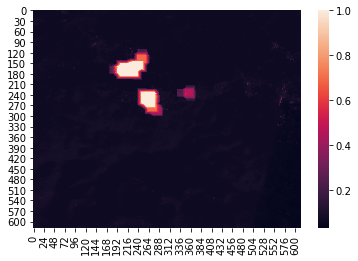

In [65]:
sns.heatmap(data[2, ..., 0])

In [5]:
data = np.load("../../src/sentinel22.npy")

y = np.load("../../src/fcps.npy")
is_one_img = (y.shape[0] - np.sum(y, axis = 0) <= 1)

def _hollstein_cld(arr):
    # Simple cloud detection algorithm
    # Generates "okay" cloud masks that are to be refined
    # From Figure 6 in Hollstein et al. 2016
    step1 = arr[..., 7] > 0.166
    step2b = arr[..., 1] > 0.21
    step3 = arr[..., 5] / arr[..., 8] < 4.292
    cl = step1 * step2b * step3
    return cl

clm = np.max(_hollstein_cld(data), axis = 0)
plt.figure(figsize=(10,9))
sns.heatmap(clm)

FileNotFoundError: [Errno 2] No such file or directory: '../../src/fcps.npy'

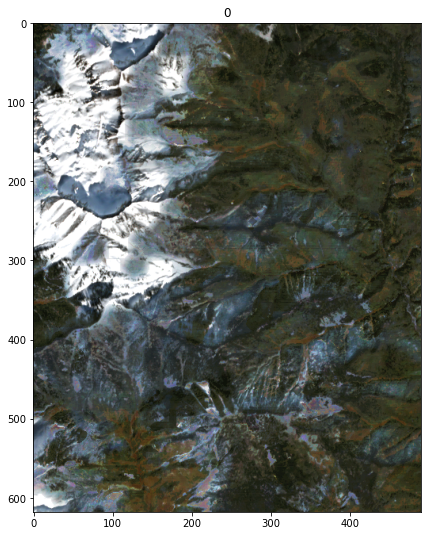

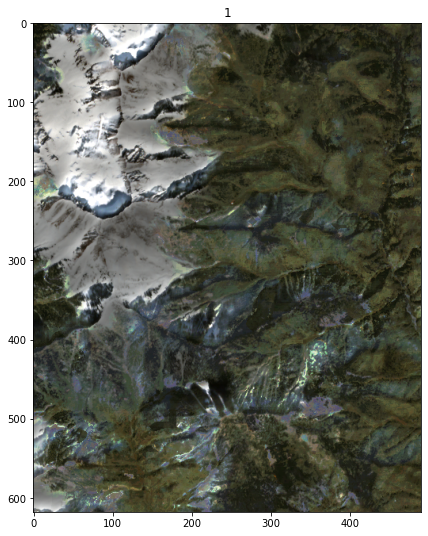

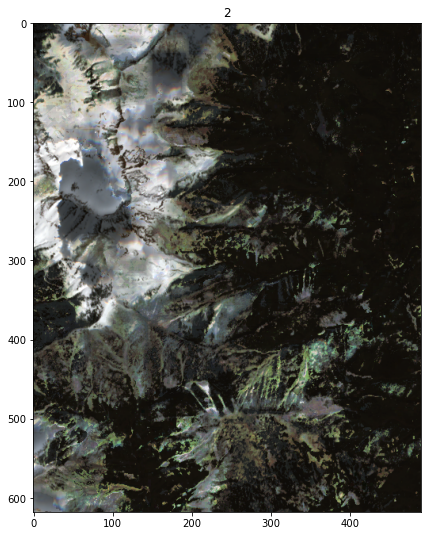

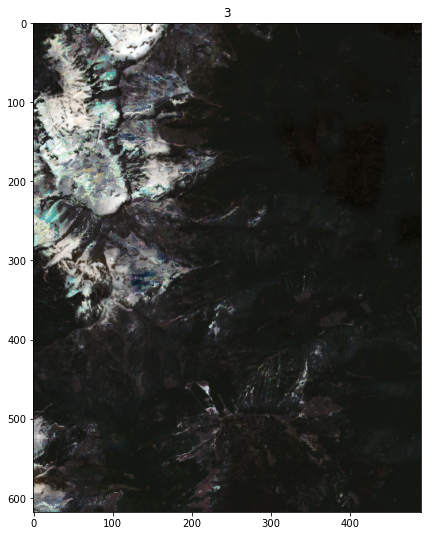

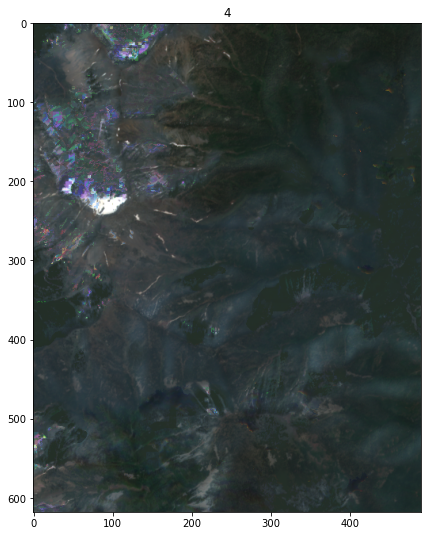

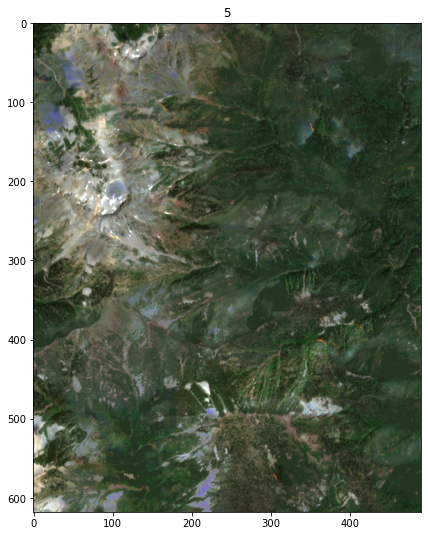

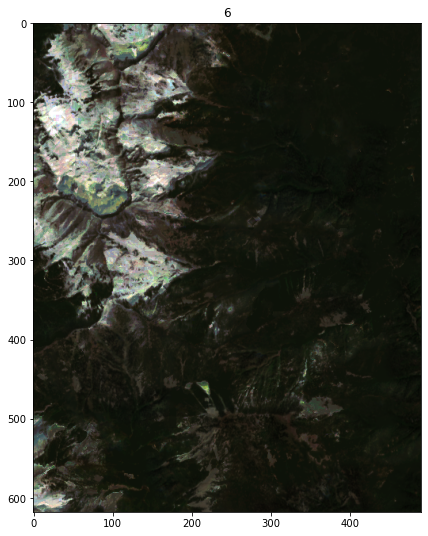

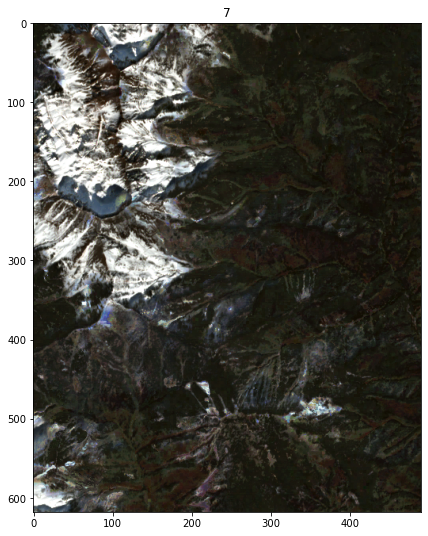

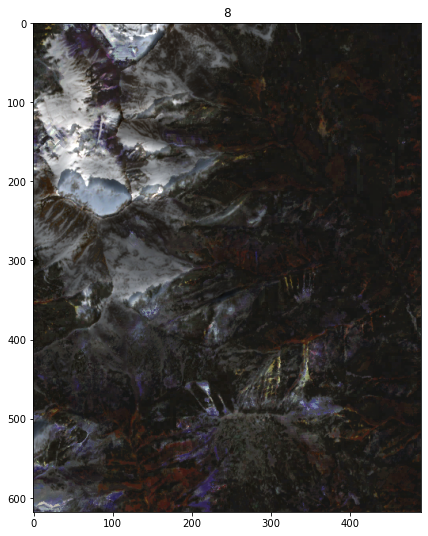

In [8]:
for i in range(0, data.shape[0]):
    im = arr_to_rgb(data, i, 0)
    plt.figure(figsize=(10,9))
    plt.imshow(im)
    plt.title(i)

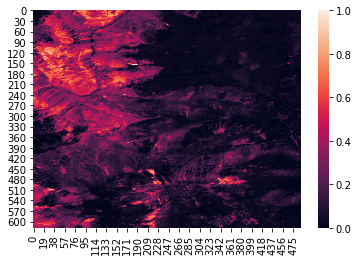

In [4]:
y = np.load("../../src/mosaic.npy")
#x = np.load("../../src/mosaic2.npy")

sns.heatmap(y[..., 0])

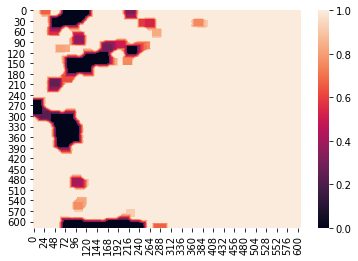

In [20]:
sns.heatmap(y[3])